<a href="https://colab.research.google.com/github/danushaaditya/Object-Detection-YOLOv5/blob/main/Custom_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

SEED = 42
np.random.seed(SEED)

In [2]:
!ls

data.yaml	    README.roboflow.txt  sample_data  train  yolov5
README.dataset.txt  roboflow.zip	 test	      valid


## Hyperparameters and Constants

Here, we define whether to train the model or not and for how many epochs to train for.

if TRAIN = False, then the last trained model will be used for inference in the notebook if run end to end.

In [3]:
TRAIN = True

# Number of epochs to train for
EPOCHS = 25

## Download and Prepare the Dataset

We will use the Vehicles-OpenImages dataset for training the custom YOLOv5 object detector.and

Let's download the dataset.

In [8]:
if not os.path.exists("train"):
  !curl -L "https://public.roboflow.com/ds/xKLV14HbTF?key=aJzo7msVta" > roboflow.zip; unzip roboflow
dirs = ["train", "valid", "test"] 

In [9]:
for i, dir_name in enumerate(dirs):
  all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
  for j, image_name in enumerate(all_image_names):
    if j%2 == 0:
      file_name = image_name.split('.jpg')[0]
      os.remove(f"{dir_name}/images/{image_name}")
      os.remove(f"{dir_name}/labels/{file_name}.txt")

## YAML File

In [10]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git
%cd yolov5/

!pip install -r requirements.txt

In [11]:
def set_res_dir():
  #Directory to store the results
  res_dir_count = len(glob.glob('runs/train/*'))
  print(f"Current number of result directoriesL {res_dir_count}")
  if TRAIN:
    RES_DIR = f"results_{res_dir_count+1}"
    print(RES_DIR)
  else:
    RES_DIR = f"results_{res_dir_count}"
  return RES_DIR

## Training the Small Model (yolov5s)

In [12]:
# Tensorboard calling function
def monitor_tensorboard():
  %load_ext tensorboard
  %tensorboard --logdir runs/train

In [13]:
monitor_tensorboard()

<IPython.core.display.Javascript object>

In [16]:
RES_DIR = set_res_dir()
!python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directoriesL 0
results_1
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-171-g6e04b94 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor

In [17]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png				    results.csv
events.out.tfevents.1684765577.5b1ef2dd0a41.5377.0  results.png
F1_curve.png					    train_batch0.jpg
hyp.yaml					    train_batch1.jpg
labels_correlogram.jpg				    train_batch2.jpg
labels.jpg					    val_batch0_labels.jpg
opt.yaml					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    weights
['runs/train/results_1/val_batch0_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg']


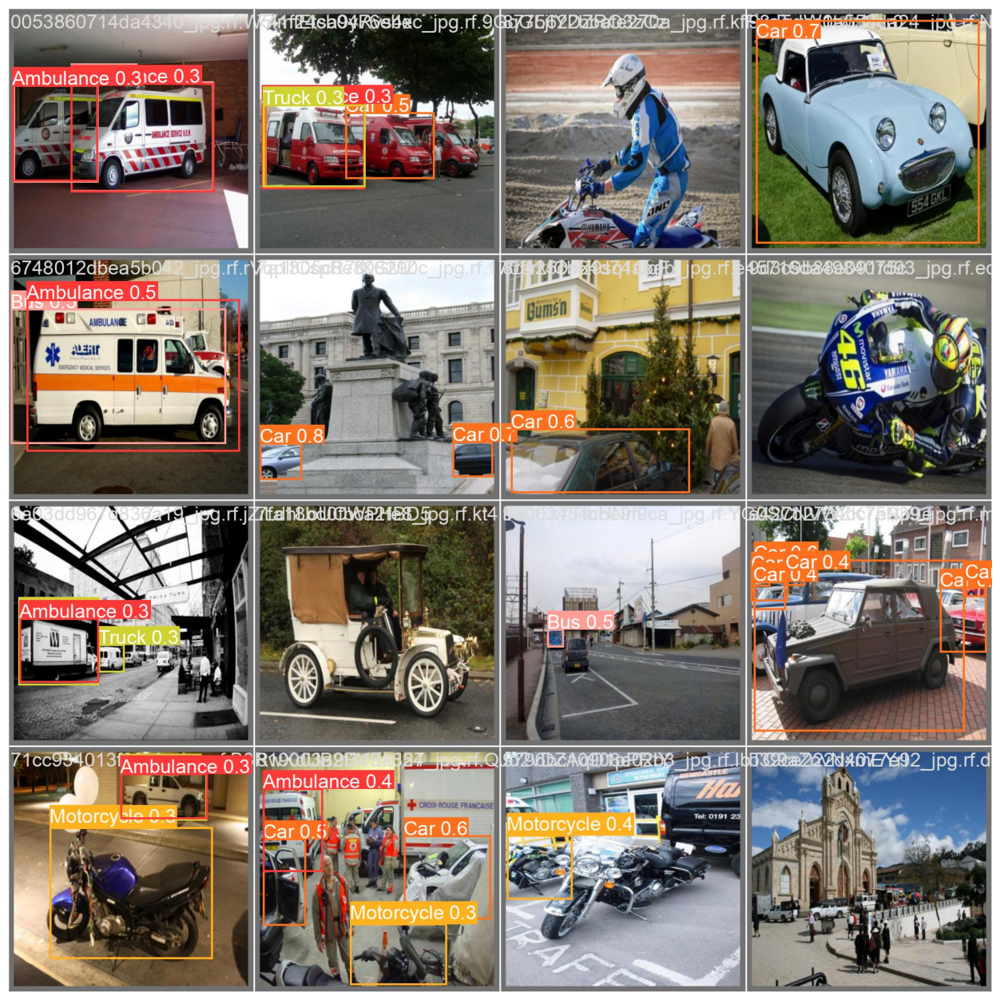

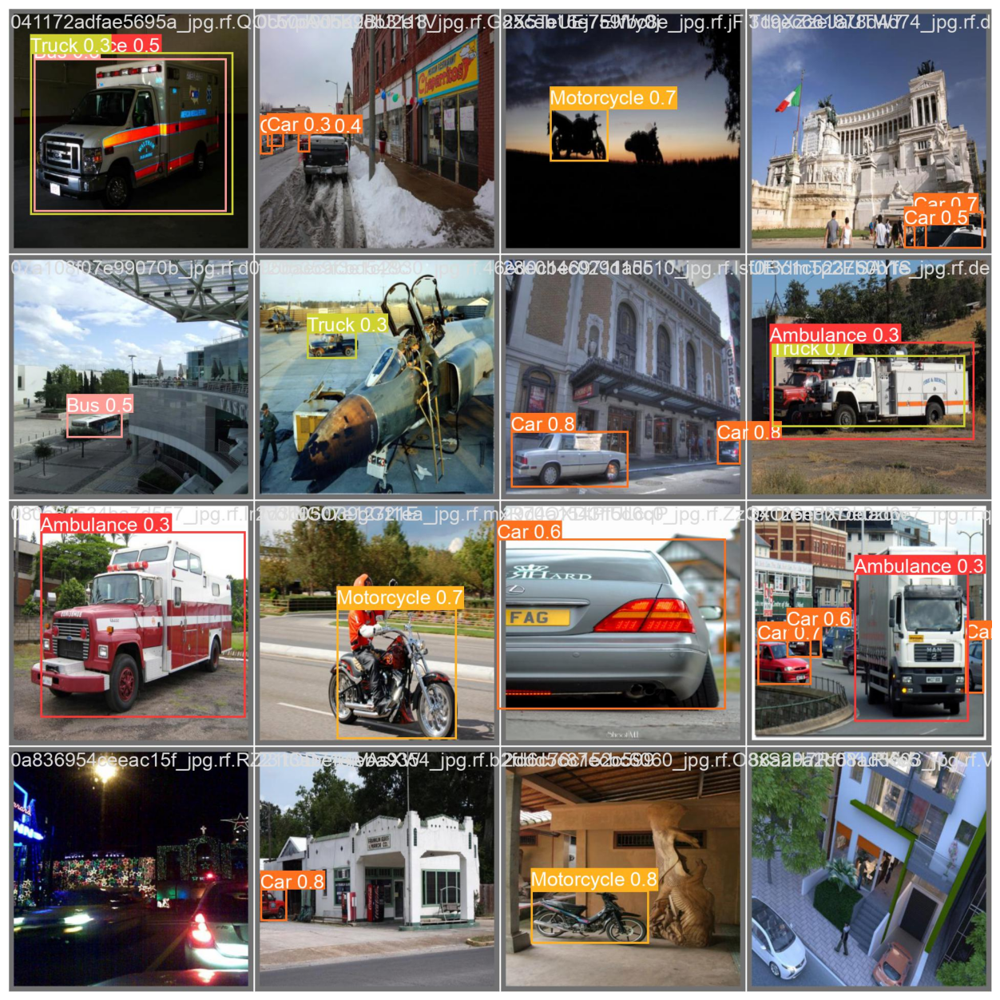

In [18]:
show_valid_results(RES_DIR)